# Ambient noise removel vignette

This vignette demonstrates step-by-step use of the ambient noise removel package to clean scRNA-seq data. 

## Preparation

First, let's import the Python packages we'll be using. If you don't have these installed, run `pip install XXX`

In [3]:
import sys 
import os
import anndata as ad
import scanpy as sc
import metacells as mc

from MCNoise.AmbientNoiseFinder import AmbientNoiseFinder
from MCNoise.AmbientNoiseEstimator import AmbientNoiseEstimator
from MCNoise.AmbientNoiseEstimator import denoise_metacells_utils, utilities, ambient_logger


%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Loading the data

The ambient noise package is built around the [metacells](https://github.com/tanaylab/metacells/) framework. In particular it uses [anndata](https://pypi.org/project/anndata/) files generated and used by the metacells package to hold the analyzed data.

You can convert data from various "standard" scRNA data formats into a `.h5ad` file using any of the functions available in the scanpy and/or anndata packages. For full walkthrough about the different metacells files and the pipeline for generating those, go to the metacells github.

For the purposes of this vignette, we'll use scRNA human bone marrow cells from the [Hourigan paper](https://insight.jci.org/articles/view/124928) which contains tweenty individuals and tweenty five different batches. We will use an already processed version of the data, containing 87K cells, with several genes removed altoghter from the matrix and with a generated metacell model for those cells.

In [4]:
data_path = "/home/drorba/raid/ambient/data/bm"
output_path = "/home/drorba/raid/ambient/out/bm"

mat_clean_path = "/home/drorba/raid/ambient/data/bm/mcs/cells.h5ad"
metacells_path = "/home/drorba/raid/ambient/data/bm/mcs/metacells.h5ad"

In [5]:
mat_ad = ad.read_h5ad(mat_clean_path)
metacells_ad = ad.read_h5ad(metacells_path)

### Loading empty droplets information

The ambient noise package uses the raw [cellranger count](https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/using/count) output to estimate the distribution of noisy genes. This is being done by aggrigating the empty droplets (cells with less then specific number of RNA molecules, default is 100).

To get this information, one should provide a mapping between each batch and the raw cellranger output. The pipelines then read each file and summaries it's information, which require from the user to specify a function able to read the cellranger files. In this specific case we will use the scanpy function: read_10x_h5

Although this process is being run in parallel, it is suggested to save the summed up data to save time. We commented out the actual lines which generate the empty droplets information and will upload the save version instead.

In [7]:
raw_input_folder = os.path.join(data_path, "GSE120221_cellranger_output")
batches = [
    "A",
    "B",
    "C1",
    "Ck",
    "C2",
    "E",
    "F",
    "G",
    "H",
    "J",
    "K",
    "L",
    "M",
    "N",
    "O",
    "P",
    "Q",
    "R",
    "S1",
    "Sk1",
    "S2",
    "Sk2",
    "T",
    "U",
    "W",
]

batches_to_mtx_paths = {
    batch: os.path.join(raw_input_folder, batch, "outs/raw_feature_bc_matrix.h5") for batch in batches
}

batch_empty_droplets = utilities.get_empty_droplets_total_genes_count(batches_to_mtx_paths, sc.read_10x_h5, number_of_processes=1)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
INFO - A had 323435(76%) out of 426783 empty droplets
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
INFO - B had 240963(79%) out of 306601 empty droplets
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
INFO - C1 had 254534(72%) out of 352172 empty droplets
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
INFO - Ck had 168881(80%) out of 211443 empty droplets
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To m

### Preparing files for pipeline

We want to make sure that the cells, metacells and empty droplets information all have the same genes to calculate the noise estimation correctly.

After that we want to add the batches names for each cell in the cell matrix. Those batch names should match the ones specific in the batches to cellranger mapping.

In [8]:
mat_ad, metacells_ad,batch_empty_droplets = utilities.remove_uncommon_genes_from_cells_metacells_empty_droplets_files(mat_ad, metacells_ad,batch_empty_droplets)

INFO - Found 7372 genes which are unique for the cells or the empty droplets information, going to drop them


In [9]:
# dataset specific functions
def add_batches_names(mat_clean):
    return [i[1] for i in mat_clean.obs.batch.str.split(".")]

## Identifying noise prone features using two-way clustering


The main object that identify noise prone features is `AmbientNoiseFinder` which gather all the needed information for this process. 
There are several parameters which effect this identification process, for a full list see doc:
- `umi_depth_number_of_bins`: Number of bins to split the cells. This separation will produce equal number of cells in each bin based on the umi depth. defaults to 3.
- `genes_clusters` amd `number_of_genes_clusters`: If `genes_clusters` is given then this is the clusters the object will use, if not then `number_of_genes_clusters` are going to be calculated. default to 10.
- `metacells_clusters` amd `minimum_metacells_in_cluster`: If `metacells_clusters` is given then this is the clusters the object will use, if not then `minimum_metacells_in_cluster` are going to be calculated. default to 5.
        
The ambient noise package estimate the noise of a cell in three different levels: the first one is based on umis count, the second is clusters of metacells and highly differential genes and the third level is batch specific.

The noise estimation is being calculated for each umis count bin individually, using all the possible metacells and genes clusters. 


In [10]:
anf = AmbientNoiseFinder(cells_adata=mat_ad, metacells_adata=metacells_ad, batches_empty_droplets_dict=batch_empty_droplets,
                  extract_batch_names_function=add_batches_names, expression_delta_for_candidates_genes=5)

INFO - Working on 25 batches
Trying to set attribute `.obs` of view, copying.
INFO - Split cells to 3 bins based umi depth, provided bins: ['(1487,2605)', '(2605,4111)', '(4111,11425)']
INFO - No gene clusters provided, will create 10 clusters
Trying to set attribute `.var` of view, copying.
INFO - No metacell clusters provided, will create 10 clusters
INFO - Ready to estimate noise levels


We will then generate plots to view this clustering results, once you feel happy with this process you can move to the next step.

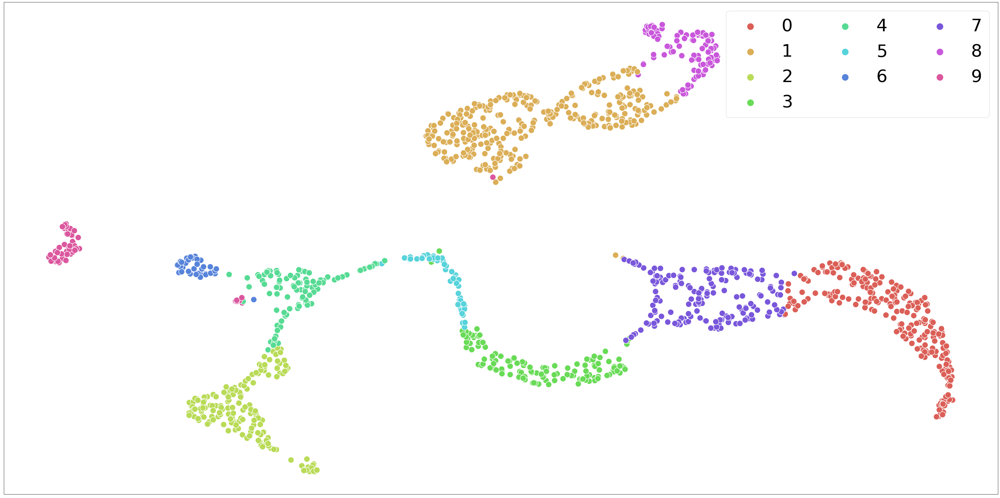

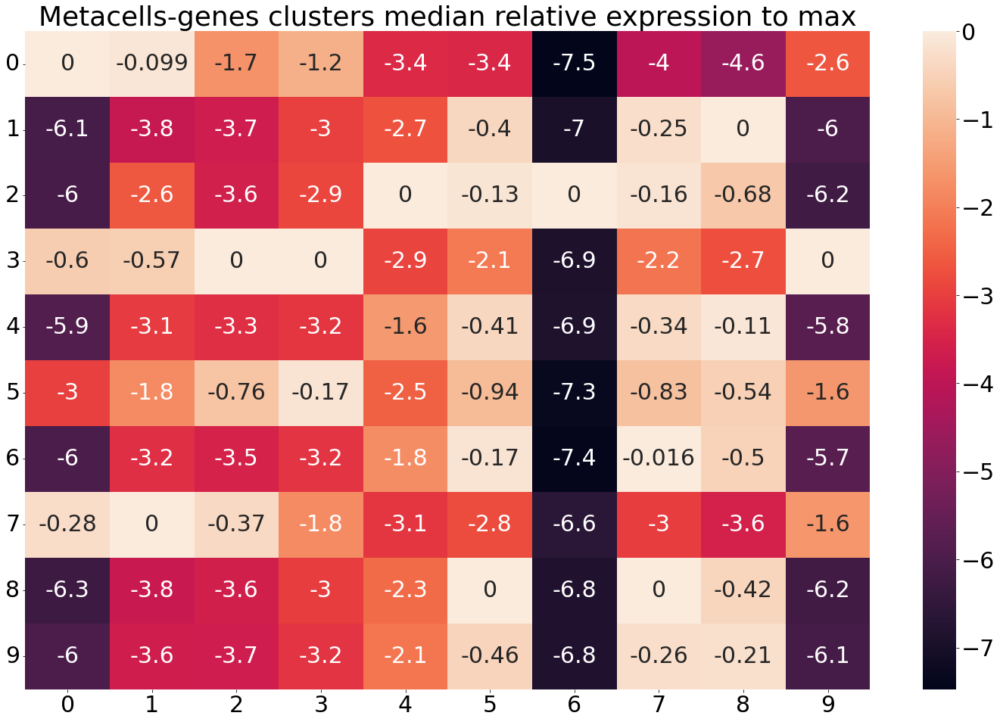

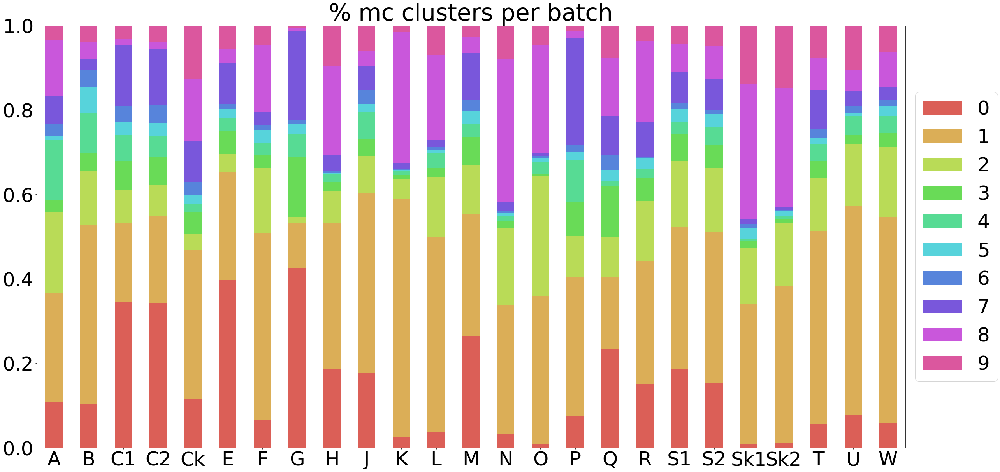

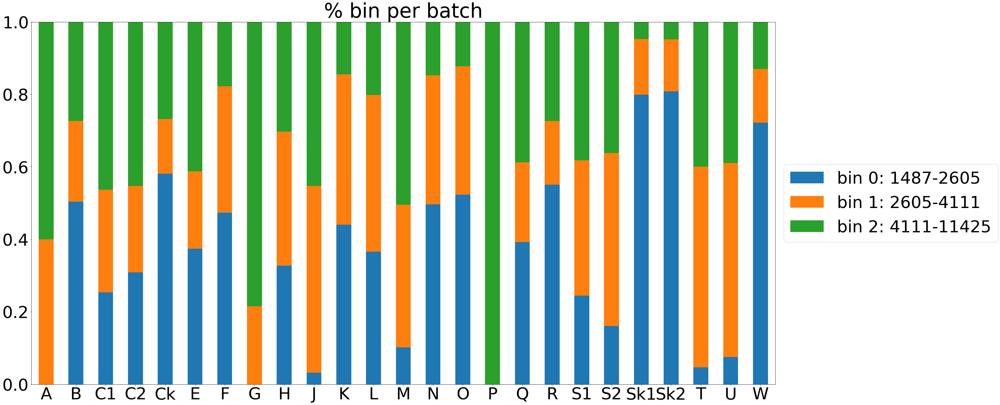

In [11]:
anf.plot_metacells_clustering_on_umap()
anf.plot_expression_diff_between_clusters(show_expression_value=True)
anf.plot_metacells_clusters_distribution_across_batches()
anf.plot_umis_depth_bins_distribution_across_batches()
anf.plot_genes_mc_clusters()

## Estimation of batch specific ambient noise levels  

The estimation process is the heart of the ambient noise package and is being performed by the `AmbientNoiseEstimator` object. 

This process assumes genes cluster which drastically expressed very little in a metacell cluster is mostly being generated by noise. This allow us to take those metacells-genes combination (named `Pgm - Pair of Genes Metacells`) and try to deconvolve the observed umis to two parts: umis which generated from noise and umis which generated from native true expression of this gene module in those metacells  (named `Egt - Expressed Genes in Type`). 
The key point is that different different pairs of metacells and genes clusters should have the same noise estimation if they share the same batch, while the same pair of metacell and gene cluster should have the same Egt even between batches.

In [12]:
ane = AmbientNoiseEstimator(anf)

The pipeline add more and more pairs of metacells and genes and try to estimate both the noise and Egt fraction simultaneously. This allows the user to view and choose the threshold most suited for the data provided. 

It is important to notice that we ignore metacells-genes couple which don't have enough umis in them, or those which appear in only few number of batches. We also ignore batches without enough metacells-genes pairs. All those thresholds can be changed in the funciton `estimate_noise_levels` (using those three parameters: `min_expected_umi_threshold`, `min_number_of_pgm_clusters_per_batch`, `min_number_of_batches_per_pgm_cluster`)

The number of different steps of estimation can be defined by the parameter `number_of_steps` which is set to 10 as default, and the upper limit of relative expression for metacells and genes can be defined by `max_relative_expression_for_metacells_genes_to_use` - this should be determined by looking at the result of `anf.plot_expression_diff_between_clusters()`

In [13]:
estimations_results = ane.estimate_noise_levels(max_relative_expression_for_metacells_genes_to_use = -4, 
                                                metacells_clusters_to_ignore=[9],
                                                genes_clusters_to_ignore=[3,8],
                                               )

INFO - Starting to estimate noise levels per step
  0%|          | 0/10 [00:00<?, ?it/s]INFO - Step: 0, umi depth bin: 0 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 1 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step: 0, umi depth bin: 2 didn't have enough valid batches or cells genes clusters to estimate noise, will move to next step
INFO - Step 0 didn't have enough equations to estimate noise, going to move to next step
INFO - Finish collecting information, solving equations for step 1
INFO - Not enough information to solve for: W_umi_depth_bin_2, will try to solve for the rest
/home/ofirr/anaconda3/envs/amosbase/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

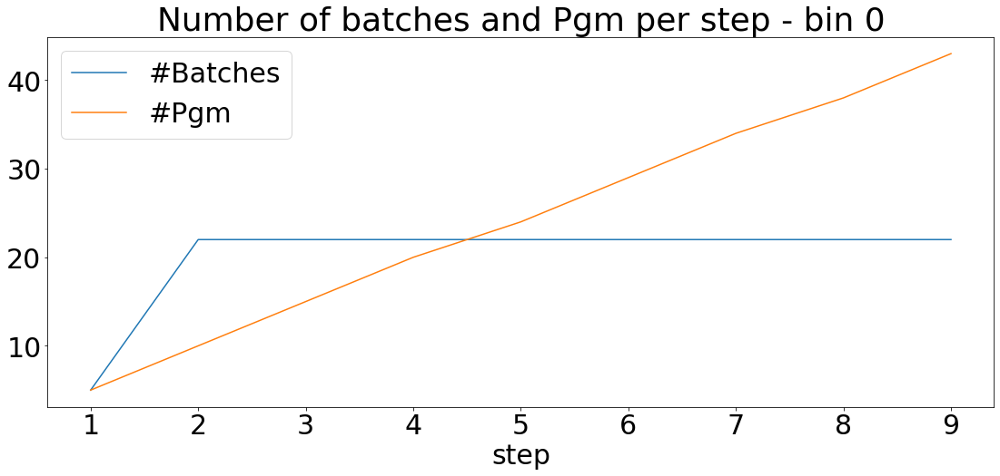

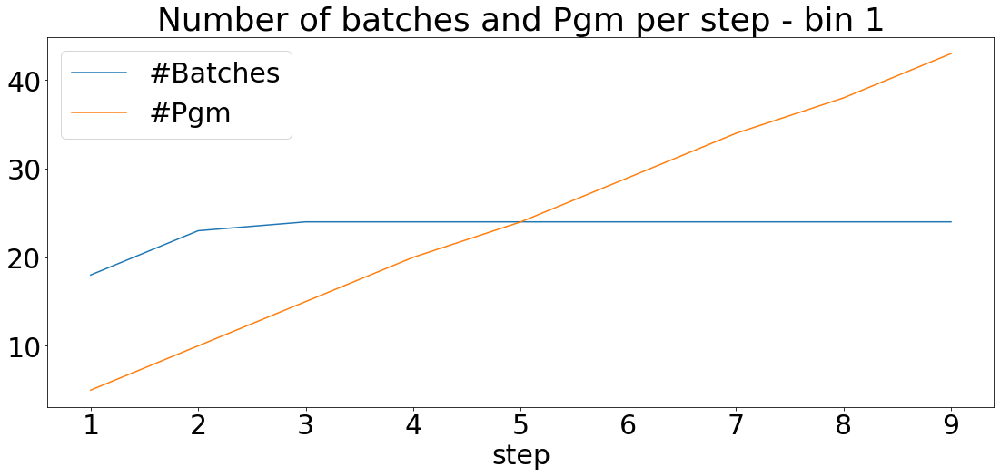

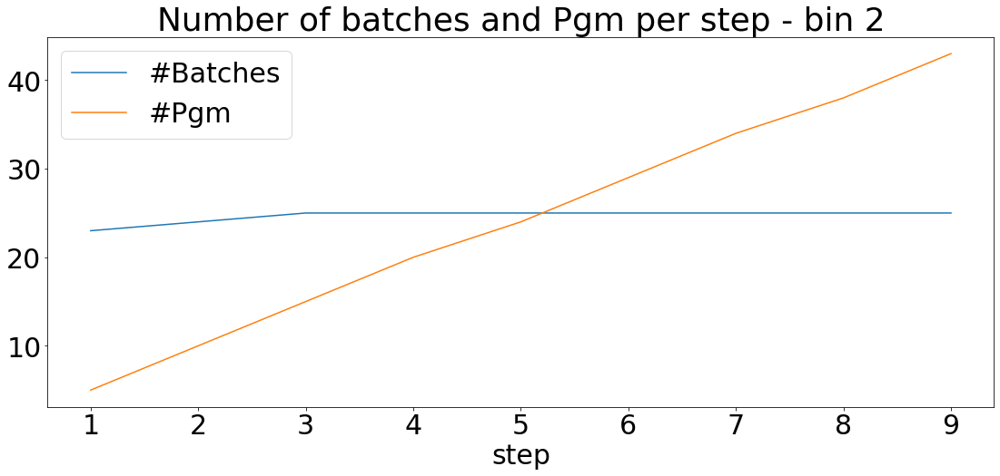

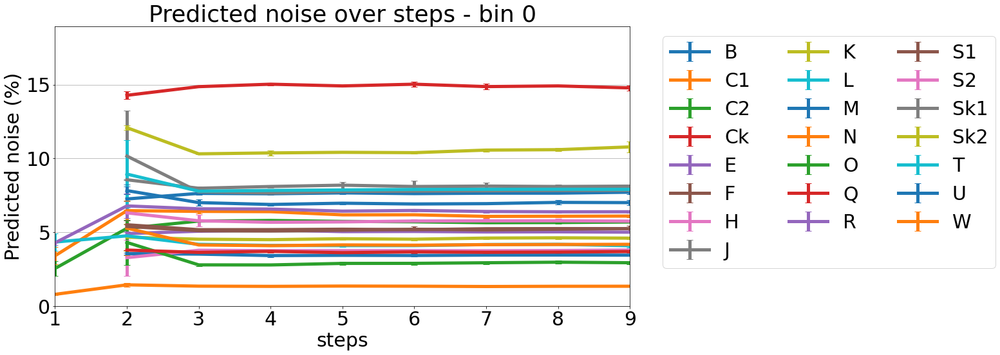

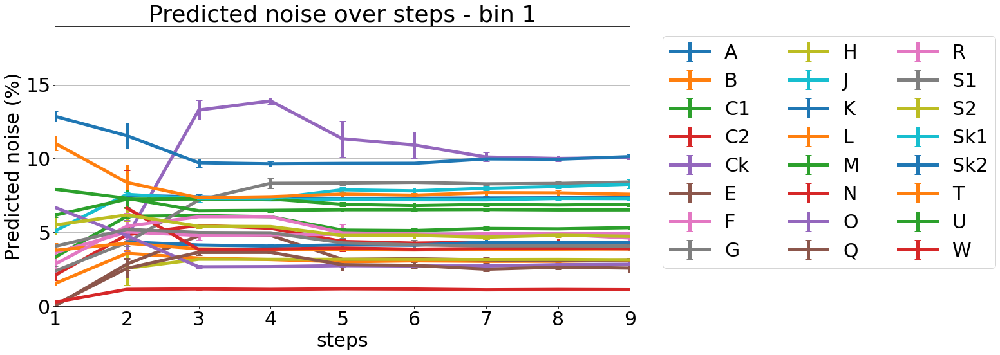

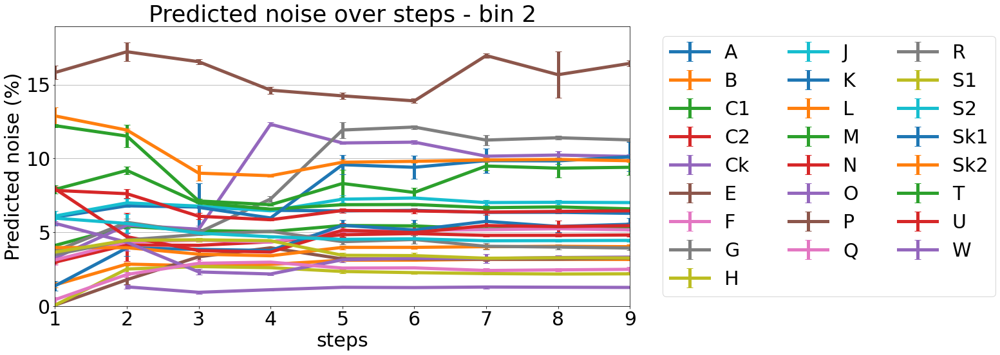

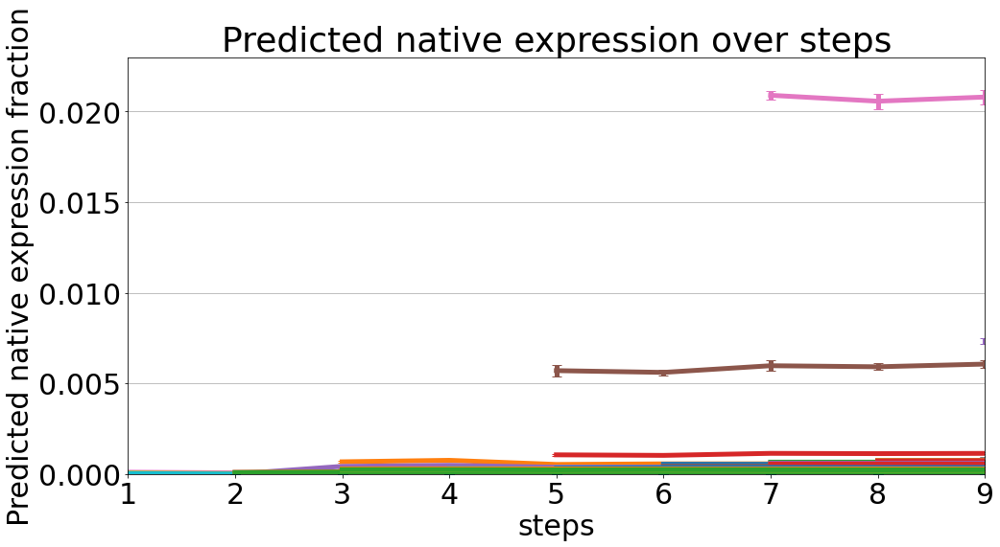

In [16]:
estimations_results.plot_number_of_batches_and_pgm_per_step()
estimations_results.plot_noise_level_estimation_per_step(show_batch_name=True)
estimations_results.plot_native_expression_estimation_per_step()

### Choosing the step for the noise estimation 

After looking at the plots we want to choose a step for the estimation which seems best for us.

In general we want to choose a threshold which allow estimation for all batches. It is better to choose one thich most of its Egt is 0 or close to it, which means that indeed most of the umis we see was generated by noise.

We will plot several graphs to see the difference in Egt between umis count bins for this specific threshold. The logic here is that there shouldn't be any difference between those, as this represent an inherit property of the metacell type. 

In [ ]:
step_to_use = 6

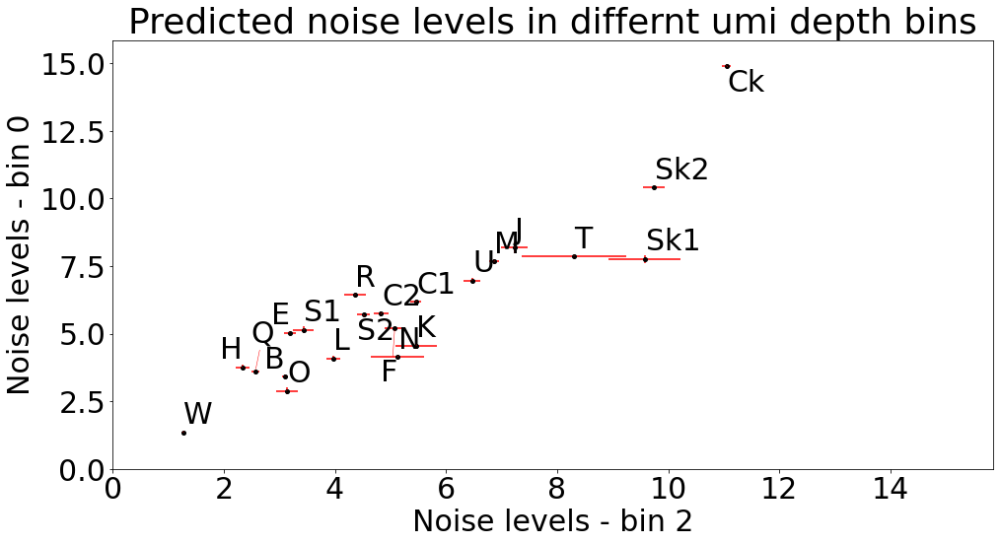

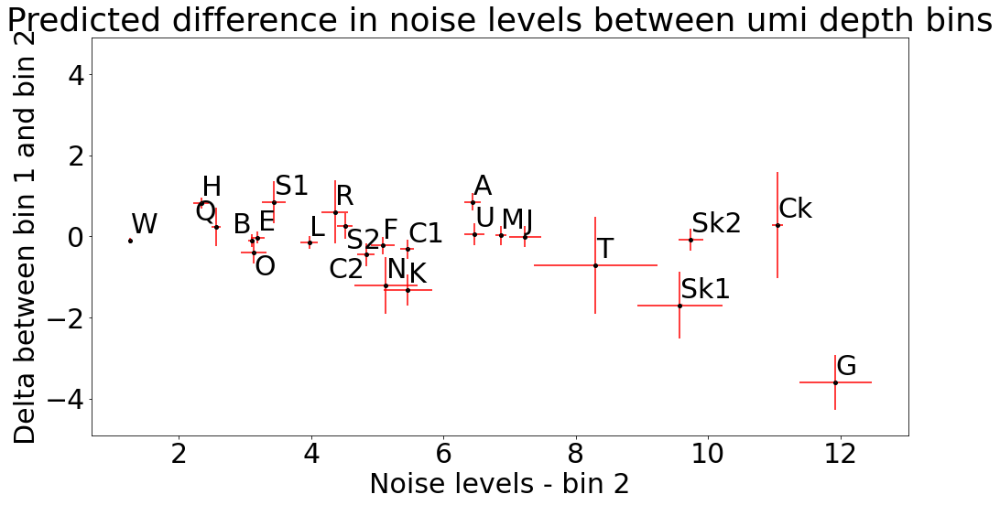

In [18]:
estimations_results.plot_noise_estimation_difference_between_umi_depth_bins(step=step_to_use,umi_depth_bin_1=2,umi_depth_bin_2=0)
estimations_results.plot_noise_estimation_delta_between_umi_depth_bins(step=step_to_use,umi_depth_bin_1=2,umi_depth_bin_2=1)

Two more important plots will be:
- `plot_observed_vs_predicted_umis`: make sure that the observerd and predicted noisy umis are close.
- `plot_log_likelihood_of_estimation`: make sure that the estimation is in a global minima, to do this we will also add a log likelihood plot which can help a user decide to take a slightly bigger or smaller noise estimation for a specific batch

/net/mraid14/export/tgdata/users/drorba/ambient/Vignette/../code_v2/EstimationResults.py:666: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.yscale("log", basey=2)
/net/mraid14/export/tgdata/users/drorba/ambient/Vignette/../code_v2/EstimationResults.py:667: MatplotlibDeprecationWarning: The 'basex' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.xscale("log", basex=2)


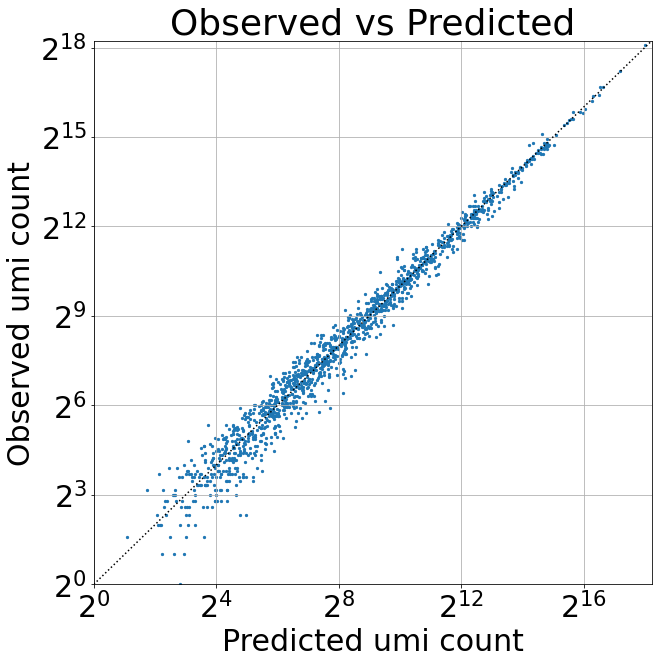

/home/ofirr/anaconda3/envs/amosbase/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/net/mraid14/export/tgdata/users/drorba/ambient/Vignette/../code_v2/EstimationResults.py:785: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  ax.set_yscale("log", basey=2)


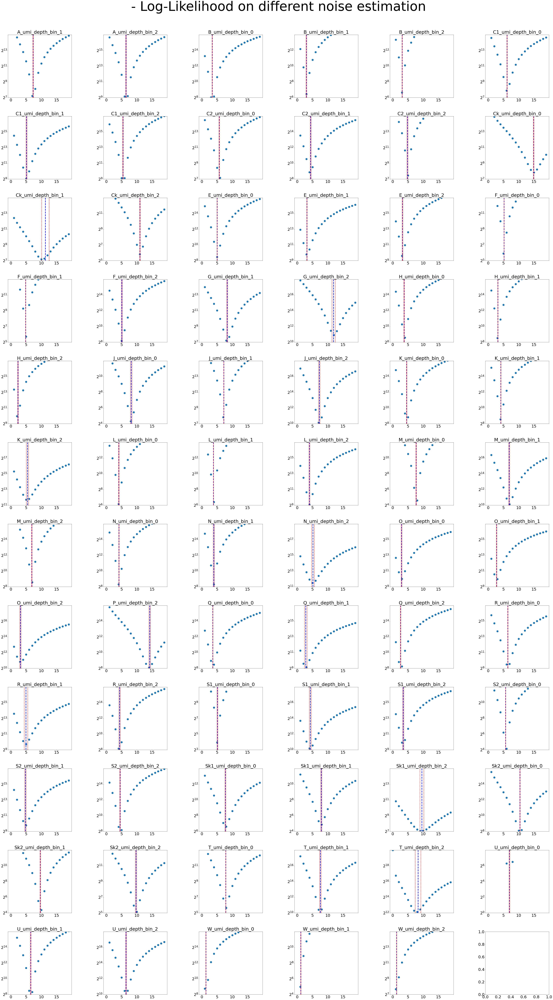

In [19]:
estimations_results.plot_observed_vs_predicted_umis(step=step_to_use)
estimations_results.plot_log_likelihood_of_estimation(step=step_to_use)

Now when we have the results we can add them to the cell andata object for further calculation.
The next steps of noise removal requires the cells adata object after the noise level estimation and the AmbientNoiseFinder object so you might wish to save them into the disk in case you don't want to perform the cleaning process right now

In [20]:
cells_adata_with_noise_level_estimations = ane.get_cells_adata_with_noise_level_estimations(estimations_results, step_to_use)

## Correcting the metacell model based on the noise estimation

The last part of the process should be correction of the metacell model. 

The first step is to re-create the metacell model with noise estimation data, this will change the cell-cell distances which in turn determine the derivation of metacells. In general, this allow for re-mixing of the cells by removing the effects of the batches those cells originated from. To read more about the different parameters of the metacell model, please see the metacell package.

The first step doesn't change the umis count of the cells or the umi count of the metacells. To actually remove those noisy umis we will do the second step. This step remove umis which are likely generated from the noise. This is being done only in the metacell level.

### Running both steps 

In [21]:
correct_ambient_noise_in_pile = denoise_metacells_utils.correct_ambient_noise_in_pile_wrapper(
    anf, cells_adata_with_noise_level_estimations
)

In [22]:
# The first step - recreating the metacell model
mc.pl.divide_and_conquer_pipeline(
    cells_adata_with_noise_level_estimations,
    forbidden_gene_names=mat_ad.var[mat_ad.var.forbidden_gene].index,
    target_metacell_size=320000,
    random_seed=123456,
    feature_correction=correct_ambient_noise_in_pile,
)

remix_mc = mc.pl.collect_metacells(cells_adata_with_noise_level_estimations, name="remix_mc")

set PBMC.clean.var[rare_gene]: 0 true (0%) out of 18685 bools
set PBMC.clean.var[rare_gene_module]: 18685 int32 elements with all outliers (100%)
set PBMC.clean.obs[cells_rare_gene_module]: 87078 int32 elements with all outliers (100%)
set PBMC.clean.obs[rare_cell]: 0 true (0%) out of 87078 bools
set PBMC.clean.uns[pre_directs]: 12
set PBMC.clean.uns[directs]: 12
set PBMC.clean.var[pre_high_total_gene]: 9938 positive (53.19%) out of 18685 int32s
set PBMC.clean.var[high_total_gene]: 11050 positive (59.14%) out of 18685 int32s
set PBMC.clean.var[pre_high_relative_variance_gene]: 6069 positive (32.48%) out of 18685 int32s
set PBMC.clean.var[high_relative_variance_gene]: 5615 positive (30.05%) out of 18685 int32s
set PBMC.clean.var[forbidden_gene]: 645 true (3.452%) out of 18685 bools
set PBMC.clean.var[pre_feature_gene]: 659 positive (3.527%) out of 18685 int32s
set PBMC.clean.var[feature_gene]: 773 positive (4.137%) out of 18685 int32s
set PBMC.clean.var[pre_gene_deviant_votes]: 1038 pos

In [23]:
# the second step - getting denoise metacell
denoise_mc_ad = denoise_metacells_utils.denoise_metacells(
    cells_adata_with_noise_level_estimations, remix_mc, anf
)

INFO - Collecting noise levels per metacell
WARNING - Found non valid var and didn't passed them, insert manualy to pass:
clean_gene, excluded_gene


In [ ]:
# saving the model
mat_ad.write_h5ad(os.path.join(output_path, "denoise_cells.h5ad"))
denoise_mc_ad.write_h5ad(os.path.join(output_path, "denoise_mc.h5ad"))

### Running only the second step

Although we advise to run both steps, it is possible to only run the second step - removing the noise, from an existing 
metacell model without generating a new model.

In [25]:
denoise_mc_ad = denoise_metacells_utils.denoise_metacells(
    cells_adata_with_noise_level_estimations, metacells_ad, anf
)

INFO - Collecting noise levels per metacell
WARNING - Found non valid obs and didn't passed them, insert manualy to pass:
umap_w, umap_u, umap_v
WARNING - Found non valid var and didn't passed them, insert manualy to pass:
clean_gene, significant_gene, excluded_gene


In [ ]:
# saving the new model
denoise_mc_ad.write_h5ad(os.path.join(output_path, "denoise_mc.h5ad"))